# EDA 3: Clusters y visualización de baja dimensionalidad

In [1]:
import pandas as pd
import numpy as np
import missingno as msno
import matplotlib.pyplot as plt
import json
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from datetime import timedelta
import seaborn as sns
import plotly.express as px
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import FunctionTransformer
import warnings
import pacmap
warnings.filterwarnings("ignore")
sns.set_style("darkgrid")

In [2]:
# read
tags=pd.read_excel("../../data/meta data/tags relevantes.xlsx")
tags_cc=tags.tag.to_list()
dic={}
for i,j in zip(tags.tag,tags.description):
    dic[i]=j
tags

,tag,description,upper bound,lower bound,unit
0,CF:CVB007_S2.PNT.FOX,granulometry,NaN,NaN,NaN
1,CF:225.WIC8067.MEAS.FOX,charge cell,NaN,NaN,NaN
2,disp_ley_pirita,pyrite law,NaN,NaN,NaN
3,disp_ley_calcopirita,chalcopyrite law,NaN,NaN,NaN
4,disp_ley_calcosina,chalcocite law,NaN,NaN,NaN
5,disp_crusher_index,crusher index,NaN,NaN,NaN
6,disp_sag_power_index,sag power index,NaN,NaN,NaN
7,disp_ball_work_index,ball work index,NaN,NaN,NaN
8,CF:215.WIC1605A.MEAS.FOX,TPH,NaN,NaN,NaN
9,CF:EXPERTO:EXP_MS_A.MEAS_5.FOX,HH TPH,NaN,NaN,NaN


In [3]:
# Se lee csv
cleaned=pd.read_csv('../../data/consolidated data/cleaned_15December2022.csv', parse_dates=['Timestamp'], index_col='Timestamp').dropna()
cleaned.sort_index(inplace=True)
cleaned.rename(columns=dic,inplace=True)
cleaned.shape

(859344, 37)

In [4]:
tags_control=['sag mill expert system', 'Limitado por Límite Alto de Tonelaje',
       'Optimizando tonelaje', 'Limitado por Peso',
       'Limitado por Corriente Bobina', 'Limitado por torque espesador 2',
       'Limitado por torque espesador 3', 'Limitado por Potencia Bolas 1',
       'Limitado por Potencia Bolas 2', 'Limitado por Pebbles',
       'Limitado por Corriente harnero', 'Limitado por Potencia SAG',
       'Limitado por limite bajo de tonelaje',
       'Limitado por Temperatura bobina', 'Limitado por presión espesador 2',
       'Limitado por presión espesador 3']

* 'Limitado por Límite Alto de Tonelaje': 1 si esta todo ok, 0 si hay perdida
* 'Limitado por Peso': no se puede subir mas tph por hh cc, 1 limitado por peso, 0 
* 'Optimizando tonelaje': 1 optimizando, 0 no optimizando

# Probar cluster por separado: Data dispatch,dispatch+granulometría,SPI+otros indices,SPI+otros indices+granulometria,HH CC+LL CC+TPH+CC+HH TPH, toda la data

# Todas las variables

In [5]:
# 2D
all_variables=cleaned.columns

df_sample=cleaned.copy().dropna().sample(5000)

# Cols
MinMax=MinMaxScaler()

# Selección de features a estandarizar (todas)

preprocessing_transformer = ColumnTransformer(transformers=[('MinMax', MinMax,  [i for i in all_variables])])

# Creación del pipeline

pipeline = Pipeline([('Preprocessing', preprocessing_transformer),('pacmap', pacmap.PaCMAP(n_components=2, n_neighbors=10))])

# Ejecución del pipeline
features_pacmap = pipeline.fit_transform(df_sample[all_variables])
features_pacmap=pd.DataFrame(features_pacmap,columns=['x_pacmap','y_pacmap'])

# Visualización de baja dimensionalidad
fig = go.Figure()

fig.add_trace(go.Scatter(x=features_pacmap['x_pacmap'], y=features_pacmap['y_pacmap'],
                    mode='markers',
                    ))

fig.update_layout(
    title="Visualización de baja dimensionalidad",
    xaxis_title='x_pacmap',
    yaxis_title='y_pacmap',height=500, width=1200
)      

fig.show()

# Iteración de inercias sobre cada número de clusters ejecutado
inertias = [
    [i, Pipeline([('Preprocessing', preprocessing_transformer),('k-means', KMeans(n_clusters=i, random_state=0))]).fit(df_sample)[1].inertia_]
    for i in range(1, 10)]

# Se guardan inercias y número de clusters en un data frame
inertias = pd.DataFrame(inertias, columns=["n° clusters", "inertia"])

# Visualización del método del codo
fig=px.line(inertias, x="n° clusters", y="inertia", title="Método del Codo con K-Means")
fig.update_layout(height=500, width=1200)
fig.show()
# Pipeline entrenamiento k-means con 6 clusters
pipeline1=Pipeline([('Preprocessing', preprocessing_transformer),('k-means', KMeans(n_clusters=4, random_state=0))])
# Entrenamiento de pipeline
pipeline1.fit(df_sample)

# Predicción de labels
labels=pipeline1.predict(df_sample)

# Para la visualización agregamos los labels al dataframe de baja dimensionalidad
features_pacmap["Labels"]=labels
features_pacmap["Labels"]=features_pacmap["Labels"].astype("category")

# Visualización de clusterización en baja dimensionalidad

fig = px.scatter(features_pacmap, x="x_pacmap", y="y_pacmap",color="Labels")

fig.update_layout(
    title="Visualización de baja dimensionalidad con clusters",
    xaxis_title='x_pacmap',
    yaxis_title='y_pacmap',
height=500, width=1200
)  
fig.show()


In [6]:
# 3D
all_variables=cleaned.columns

df_sample=cleaned.copy().dropna().sample(5000)

# Cols
MinMax=MinMaxScaler()

# Selección de features a estandarizar (todas)

preprocessing_transformer = ColumnTransformer(transformers=[('MinMax', MinMax,  [i for i in all_variables])])

# Creación del pipeline

pipeline = Pipeline([('Preprocessing', preprocessing_transformer),('pacmap', pacmap.PaCMAP(n_components=3, n_neighbors=10))])

# Ejecución del pipeline
features_pacmap = pipeline.fit_transform(df_sample[all_variables])
features_pacmap=pd.DataFrame(features_pacmap,columns=['x_pacmap','y_pacmap','z_pacmap'])

# Visualización de baja dimensionalidad
fig = go.Figure()

fig.add_trace(go.Scatter(x=features_pacmap['x_pacmap'], y=features_pacmap['y_pacmap'],
                    mode='markers',
                    ))

# estimated_sells
fig = px.scatter_3d(
    features_pacmap,
    x='x_pacmap',
    y='y_pacmap',
    z='z_pacmap',
 
    title='3d pacmap'
)
fig.update_layout(
height=500, width=1200
)  
fig.show()

# Iteración de inercias sobre cada número de clusters ejecutado
inertias = [
    [i, Pipeline([('Preprocessing', preprocessing_transformer),('k-means', KMeans(n_clusters=i, random_state=0))]).fit(df_sample)[1].inertia_]
    for i in range(1, 10)]

# Se guardan inercias y número de clusters en un data frame
inertias = pd.DataFrame(inertias, columns=["n° clusters", "inertia"])

# Visualización del método del codo
fig=px.line(inertias, x="n° clusters", y="inertia", title="Método del Codo con K-Means")
fig.update_layout(height=500, width=1200)
fig.show()
# Pipeline entrenamiento k-means con 6 clusters
pipeline1=Pipeline([('Preprocessing', preprocessing_transformer),('k-means', KMeans(n_clusters=4, random_state=0))])
# Entrenamiento de pipeline
pipeline1.fit(df_sample)

# Predicción de labels
labels=pipeline1.predict(df_sample)

# Para la visualización agregamos los labels al dataframe de baja dimensionalidad
features_pacmap["Labels"]=labels
features_pacmap["Labels"]=features_pacmap["Labels"].astype("category")

# Visualización de clusterización en baja dimensionalidad

fig = px.scatter(features_pacmap, x="x_pacmap", y="y_pacmap",color="Labels")

# estimated_sells
fig = px.scatter_3d(
    features_pacmap,
    x='x_pacmap',
    y='y_pacmap',
    z='z_pacmap',
    color="Labels",
    title='3d pacmap'
)

fig.update_layout(
height=500, width=1200
)  
fig.show()

In [7]:
tag_pairplot=[i for i in cleaned.columns.to_list() if i not in tags_control]

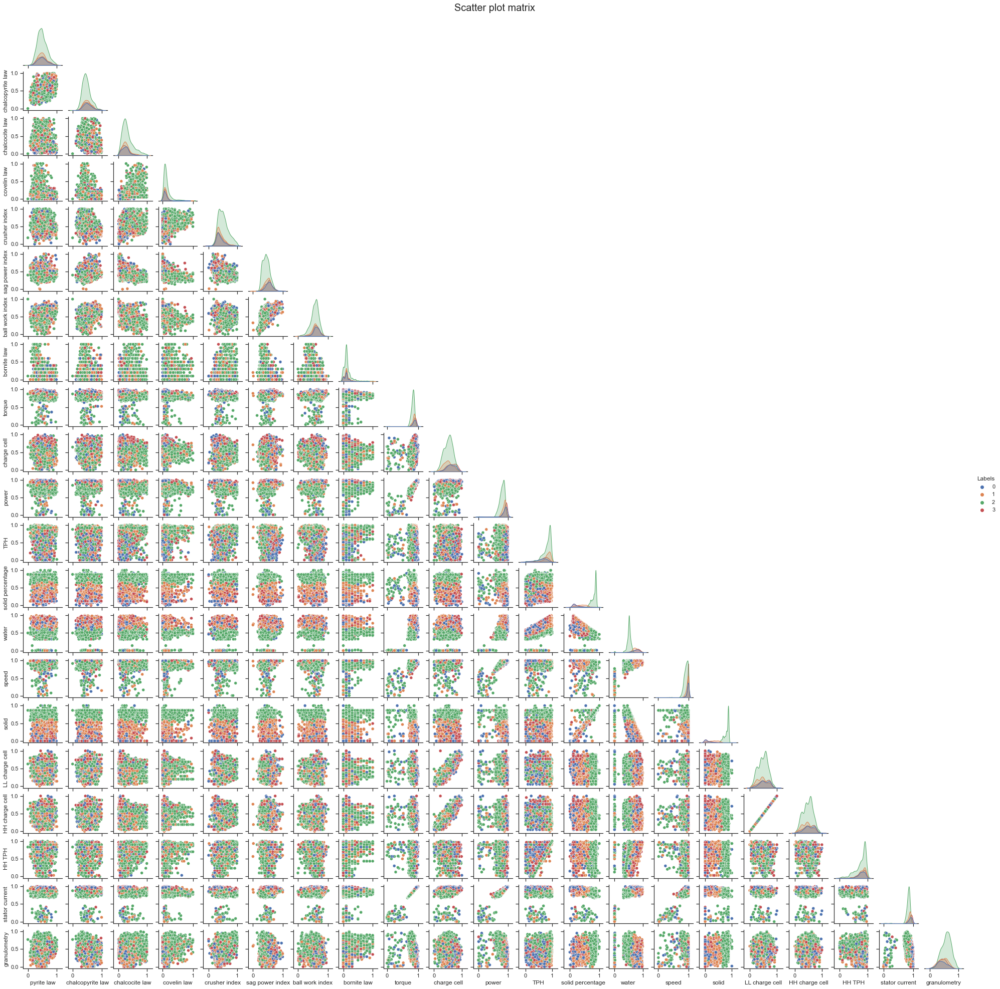

In [8]:
# Visualización de variables estandarizadas
matrix=pd.DataFrame(MinMax.fit_transform(df_sample[tag_pairplot]),columns=tag_pairplot)
matrix["Labels"]=labels
matrix["Labels"]=matrix["Labels"].astype("category")
sns.set(style="ticks", color_codes=True)
g=sns.pairplot(matrix,diag_kind="kde",hue="Labels",height=1.3,corner=True)
g.fig.suptitle("Scatter plot matrix",position=(0.5, 1.01),fontsize=20)
plt.show()


# Dispatch

In [9]:
# 2D
tags_dispatch=['pyrite law', 'chalcopyrite law', 'chalcocite law', 'covelin law',
       'crusher index', 'sag power index', 'ball work index', 'bornite law']

df_sample=cleaned.copy().dropna().sample(5000)

# Cols
MinMax=MinMaxScaler()

# Selección de features a estandarizar (todas)

preprocessing_transformer = ColumnTransformer(transformers=[('MinMax', MinMax,  [i for i in tags_dispatch])])

# Creación del pipeline

pipeline = Pipeline([('Preprocessing', preprocessing_transformer),('pacmap', pacmap.PaCMAP(n_components=2, n_neighbors=10))])

# Ejecución del pipeline
features_pacmap = pipeline.fit_transform(df_sample[tags_dispatch])
features_pacmap=pd.DataFrame(features_pacmap,columns=['x_pacmap','y_pacmap'])

# Visualización de baja dimensionalidad
fig = go.Figure()

fig.add_trace(go.Scatter(x=features_pacmap['x_pacmap'], y=features_pacmap['y_pacmap'],
                    mode='markers',
                    ))

fig.update_layout(
    title="Visualización de baja dimensionalidad",
    xaxis_title='x_pacmap',
    yaxis_title='y_pacmap',height=500, width=1200
)      

fig.show()

# Iteración de inercias sobre cada número de clusters ejecutado
inertias = [
    [i, Pipeline([('Preprocessing', preprocessing_transformer),('k-means', KMeans(n_clusters=i, random_state=0))]).fit(df_sample)[1].inertia_]
    for i in range(1, 10)]

# Se guardan inercias y número de clusters en un data frame
inertias = pd.DataFrame(inertias, columns=["n° clusters", "inertia"])

# Visualización del método del codo
fig=px.line(inertias, x="n° clusters", y="inertia", title="Método del Codo con K-Means")
fig.update_layout(height=500, width=1200)
fig.show()
# Pipeline entrenamiento k-means con 6 clusters
pipeline1=Pipeline([('Preprocessing', preprocessing_transformer),('k-means', KMeans(n_clusters=4, random_state=0))])
# Entrenamiento de pipeline
pipeline1.fit(df_sample)

# Predicción de labels
labels=pipeline1.predict(df_sample)

# Para la visualización agregamos los labels al dataframe de baja dimensionalidad
features_pacmap["Labels"]=labels
features_pacmap["Labels"]=features_pacmap["Labels"].astype("category")

# Visualización de clusterización en baja dimensionalidad

fig = px.scatter(features_pacmap, x="x_pacmap", y="y_pacmap",color="Labels")

fig.update_layout(
    title="Visualización de baja dimensionalidad con clusters",
    xaxis_title='x_pacmap',
    yaxis_title='y_pacmap',
height=500, width=1200
)  
fig.show()

In [10]:
# 3D
df_sample=cleaned.copy().dropna().sample(5000)

# Cols
MinMax=MinMaxScaler()

# Selección de features a estandarizar (todas)

preprocessing_transformer = ColumnTransformer(transformers=[('MinMax', MinMax,  [i for i in tags_dispatch])])

# Creación del pipeline

pipeline = Pipeline([('Preprocessing', preprocessing_transformer),('pacmap', pacmap.PaCMAP(n_components=3, n_neighbors=10))])

# Ejecución del pipeline
features_pacmap = pipeline.fit_transform(df_sample[tags_dispatch])
features_pacmap=pd.DataFrame(features_pacmap,columns=['x_pacmap','y_pacmap','z_pacmap'])


fig = px.scatter_3d(
    features_pacmap,
    x='x_pacmap',
    y='y_pacmap',
    z='z_pacmap',
 
    title='3d pacmap'
)
fig.update_layout(
height=500, width=1200
)  
fig.show()

# Iteración de inercias sobre cada número de clusters ejecutado
inertias = [
    [i, Pipeline([('Preprocessing', preprocessing_transformer),('k-means', KMeans(n_clusters=i, random_state=0))]).fit(df_sample)[1].inertia_]
    for i in range(1, 10)]

# Se guardan inercias y número de clusters en un data frame
inertias = pd.DataFrame(inertias, columns=["n° clusters", "inertia"])

# Visualización del método del codo
fig=px.line(inertias, x="n° clusters", y="inertia", title="Método del Codo con K-Means")
fig.update_layout(height=500, width=1200)
fig.show()


# Pipeline entrenamiento k-means con 6 clusters
pipeline1=Pipeline([('Preprocessing', preprocessing_transformer),('k-means', KMeans(n_clusters=4, random_state=0))])
# Entrenamiento de pipeline
pipeline1.fit(df_sample)

# Predicción de labels
labels=pipeline1.predict(df_sample)

# Para la visualización agregamos los labels al dataframe de baja dimensionalidad
features_pacmap["Labels"]=labels
features_pacmap["Labels"]=features_pacmap["Labels"].astype("category")

# Visualización de clusterización en baja dimensionalidad
fig = px.scatter_3d(
    features_pacmap,
    x='x_pacmap',
    y='y_pacmap',
    z='z_pacmap',
    color="Labels",
    title='3d pacmap'
)

fig.update_layout(
height=500, width=1200
)  
fig.show()

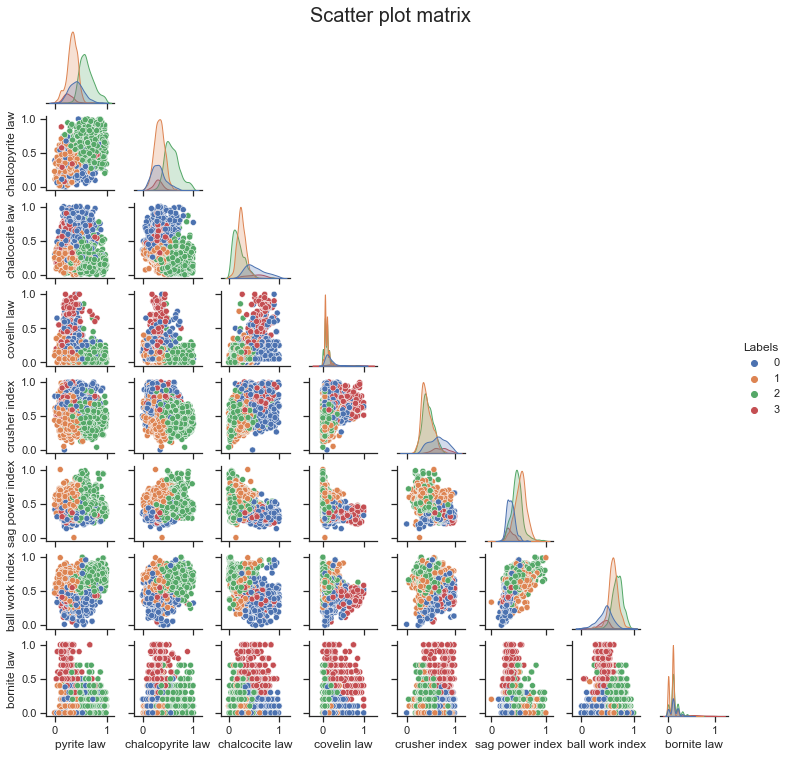

In [11]:
# Visualización de variables estandarizadas
matrix=pd.DataFrame(MinMax.fit_transform(df_sample[tags_dispatch]),columns=tags_dispatch)
matrix["Labels"]=labels
matrix["Labels"]=matrix["Labels"].astype("category")
sns.set(style="ticks", color_codes=True)
g=sns.pairplot(matrix,diag_kind="kde",hue="Labels",height=1.3,corner=True)
g.fig.suptitle("Scatter plot matrix",position=(0.5, 1.01),fontsize=20)
plt.show()

# Dispatch+granulometría

In [12]:
tags_dispatch=['pyrite law', 'chalcopyrite law', 'chalcocite law', 'covelin law',
       'crusher index', 'sag power index', 'ball work index', 'bornite law']+["granulometry"]

df_sample=cleaned.copy().dropna().sample(5000)

# Cols
MinMax=MinMaxScaler()

# Selección de features a estandarizar (todas)

preprocessing_transformer = ColumnTransformer(transformers=[('MinMax', MinMax,  [i for i in tags_dispatch])])

# Creación del pipeline

pipeline = Pipeline([('Preprocessing', preprocessing_transformer),('TSNE', pacmap.PaCMAP(n_components=2, n_neighbors=10))])

# Ejecución del pipeline
features_tsne_embedded = pipeline.fit_transform(df_sample[tags_dispatch])
features_tsne_embedded=pd.DataFrame(features_tsne_embedded,columns=['x_tsne','y_tsne'])

# Visualización de baja dimensionalidad
fig = go.Figure()

fig.add_trace(go.Scatter(x=features_tsne_embedded['x_tsne'], y=features_tsne_embedded['y_tsne'],
                    mode='markers',
                    ))

fig.update_layout(
    title="Visualización de baja dimensionalidad",
    xaxis_title='x_tsne',
    yaxis_title='y_tsne',height=500, width=1200
)      

fig.show()

# Iteración de inercias sobre cada número de clusters ejecutado
inertias = [
    [i, Pipeline([('Preprocessing', preprocessing_transformer),('k-means', KMeans(n_clusters=i, random_state=0))]).fit(df_sample)[1].inertia_]
    for i in range(1, 10)]

# Se guardan inercias y número de clusters en un data frame
inertias = pd.DataFrame(inertias, columns=["n° clusters", "inertia"])

# Visualización del método del codo
fig=px.line(inertias, x="n° clusters", y="inertia", title="Método del Codo con K-Means")
fig.update_layout(height=500, width=1200)
fig.show()
# Pipeline entrenamiento k-means con 6 clusters
pipeline1=Pipeline([('Preprocessing', preprocessing_transformer),('k-means', KMeans(n_clusters=3, random_state=0))])
# Entrenamiento de pipeline
pipeline1.fit(df_sample)

# Predicción de labels
labels=pipeline1.predict(df_sample)

# Para la visualización agregamos los labels al dataframe de baja dimensionalidad
features_tsne_embedded["Labels"]=labels
features_tsne_embedded["Labels"]=features_tsne_embedded["Labels"].astype("category")

# Visualización de clusterización en baja dimensionalidad

fig = px.scatter(features_tsne_embedded, x="x_tsne", y="y_tsne",color="Labels")

fig.update_layout(
    title="Visualización de baja dimensionalidad con clusters",
    xaxis_title='x_tsne',
    yaxis_title='y_tsne',
height=500, width=1200
)  
fig.show()

In [13]:
# 3D
df_sample=cleaned.copy().dropna().sample(5000)

# Cols
MinMax=MinMaxScaler()

# Selección de features a estandarizar (todas)

preprocessing_transformer = ColumnTransformer(transformers=[('MinMax', MinMax,  [i for i in tags_dispatch])])

# Creación del pipeline

pipeline = Pipeline([('Preprocessing', preprocessing_transformer),('pacmap', pacmap.PaCMAP(n_components=3, n_neighbors=10))])

# Ejecución del pipeline
features_pacmap = pipeline.fit_transform(df_sample[tags_dispatch])
features_pacmap=pd.DataFrame(features_pacmap,columns=['x_pacmap','y_pacmap','z_pacmap'])


fig = px.scatter_3d(
    features_pacmap,
    x='x_pacmap',
    y='y_pacmap',
    z='z_pacmap',
 
    title='3d pacmap'
)
fig.update_layout(
height=500, width=1200
)  
fig.show()

# Iteración de inercias sobre cada número de clusters ejecutado
inertias = [
    [i, Pipeline([('Preprocessing', preprocessing_transformer),('k-means', KMeans(n_clusters=i, random_state=0))]).fit(df_sample)[1].inertia_]
    for i in range(1, 10)]

# Se guardan inercias y número de clusters en un data frame
inertias = pd.DataFrame(inertias, columns=["n° clusters", "inertia"])

# Visualización del método del codo
fig=px.line(inertias, x="n° clusters", y="inertia", title="Método del Codo con K-Means")
fig.update_layout(height=500, width=1200)
fig.show()


# Pipeline entrenamiento k-means con 6 clusters
pipeline1=Pipeline([('Preprocessing', preprocessing_transformer),('k-means', KMeans(n_clusters=4, random_state=0))])
# Entrenamiento de pipeline
pipeline1.fit(df_sample)

# Predicción de labels
labels=pipeline1.predict(df_sample)

# Para la visualización agregamos los labels al dataframe de baja dimensionalidad
features_pacmap["Labels"]=labels
features_pacmap["Labels"]=features_pacmap["Labels"].astype("category")

# Visualización de clusterización en baja dimensionalidad
fig = px.scatter_3d(
    features_pacmap,
    x='x_pacmap',
    y='y_pacmap',
    z='z_pacmap',
    color="Labels",
    title='3d pacmap'
)

fig.update_layout(
height=500, width=1200
)  
fig.show()

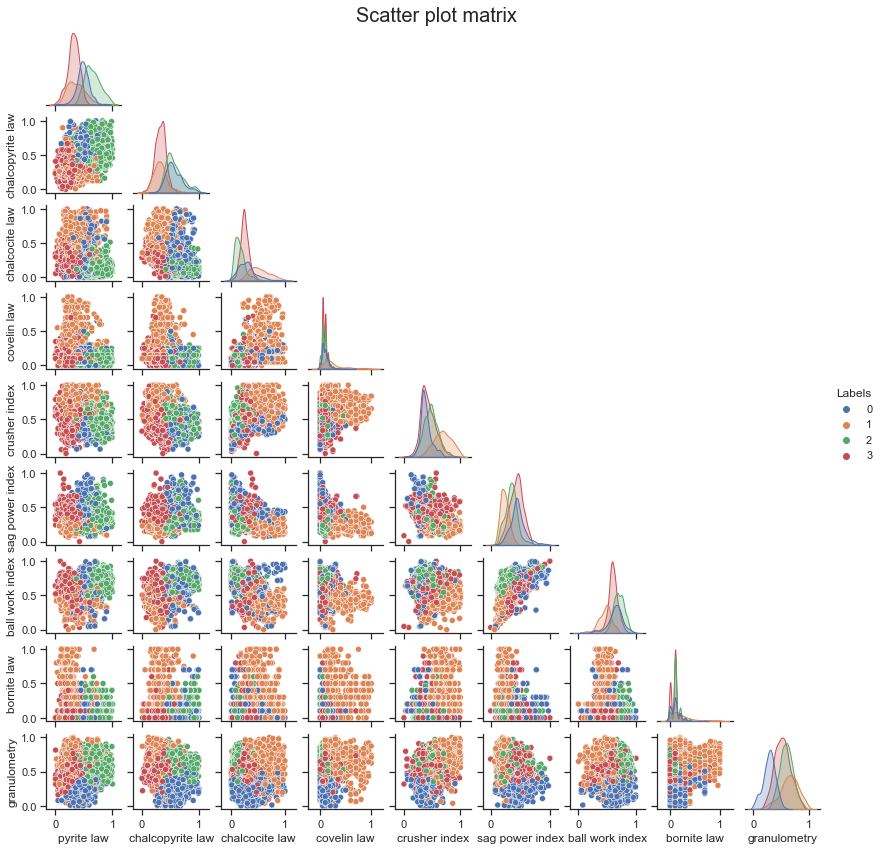

In [14]:
# Visualización de variables estandarizadas
matrix=pd.DataFrame(MinMax.fit_transform(df_sample[tags_dispatch]),columns=tags_dispatch)
matrix["Labels"]=labels
matrix["Labels"]=matrix["Labels"].astype("category")
sns.set(style="ticks", color_codes=True)
g=sns.pairplot(matrix,diag_kind="kde",hue="Labels",height=1.3,corner=True)
g.fig.suptitle("Scatter plot matrix",position=(0.5, 1.01),fontsize=20)
plt.show()

# Solo indices

In [16]:
tags_dispatch=['crusher index', 'sag power index', 'ball work index']

df_sample=cleaned.copy().dropna().sample(5000)

# Cols
MinMax=MinMaxScaler()

# Selección de features a estandarizar (todas)

preprocessing_transformer = ColumnTransformer(transformers=[('MinMax', MinMax,  [i for i in tags_dispatch])])

# Creación del pipeline

pipeline = Pipeline([('Preprocessing', preprocessing_transformer),('TSNE',pacmap.PaCMAP(n_components=2, n_neighbors=10))])

# Ejecución del pipeline
features_tsne_embedded = pipeline.fit_transform(df_sample[tags_dispatch])
features_tsne_embedded=pd.DataFrame(features_tsne_embedded,columns=['x_tsne','y_tsne'])

# Visualización de baja dimensionalidad
fig = go.Figure()

fig.add_trace(go.Scatter(x=features_tsne_embedded['x_tsne'], y=features_tsne_embedded['y_tsne'],
                    mode='markers',
                    ))

fig.update_layout(
    title="Visualización de baja dimensionalidad",
    xaxis_title='x_tsne',
    yaxis_title='y_tsne',height=500, width=1200
)      

fig.show()


# Iteración de inercias sobre cada número de clusters ejecutado
inertias = [
    [i, Pipeline([('Preprocessing', preprocessing_transformer),('k-means', KMeans(n_clusters=i, random_state=0))]).fit(df_sample)[1].inertia_]
    for i in range(1, 10)]

# Se guardan inercias y número de clusters en un data frame
inertias = pd.DataFrame(inertias, columns=["n° clusters", "inertia"])

# Visualización del método del codo
fig=px.line(inertias, x="n° clusters", y="inertia", title="Método del Codo con K-Means")
fig.update_layout(height=500, width=1200)
fig.show()


In [17]:

# Pipeline entrenamiento k-means con 6 clusters
pipeline1=Pipeline([('Preprocessing', preprocessing_transformer),('k-means', KMeans(n_clusters=3, random_state=0))])
# Entrenamiento de pipeline
pipeline1.fit(df_sample)

# Predicción de labels
labels=pipeline1.predict(df_sample)

# Para la visualización agregamos los labels al dataframe de baja dimensionalidad
features_tsne_embedded["Labels"]=labels
features_tsne_embedded["Labels"]=features_tsne_embedded["Labels"].astype("category")

# Visualización de clusterización en baja dimensionalidad

fig = px.scatter(features_tsne_embedded, x="x_tsne", y="y_tsne",color="Labels")

fig.update_layout(
    title="Visualización de baja dimensionalidad con clusters",
    xaxis_title='x_tsne',
    yaxis_title='y_tsne',
height=500, width=1200
)  
fig.show()

In [18]:
# 3D
df_sample=cleaned.copy().dropna().sample(5000)

# Cols
MinMax=MinMaxScaler()

# Selección de features a estandarizar (todas)

preprocessing_transformer = ColumnTransformer(transformers=[('MinMax', MinMax,  [i for i in tags_dispatch])])

# Creación del pipeline

pipeline = Pipeline([('Preprocessing', preprocessing_transformer),('pacmap', pacmap.PaCMAP(n_components=3, n_neighbors=10))])

# Ejecución del pipeline
features_pacmap = pipeline.fit_transform(df_sample[tags_dispatch])
features_pacmap=pd.DataFrame(features_pacmap,columns=['x_pacmap','y_pacmap','z_pacmap'])


fig = px.scatter_3d(
    features_pacmap,
    x='x_pacmap',
    y='y_pacmap',
    z='z_pacmap',
 
    title='3d pacmap'
)
fig.update_layout(
height=500, width=1200
)  
fig.show()

# Iteración de inercias sobre cada número de clusters ejecutado
inertias = [
    [i, Pipeline([('Preprocessing', preprocessing_transformer),('k-means', KMeans(n_clusters=i, random_state=0))]).fit(df_sample)[1].inertia_]
    for i in range(1, 10)]

# Se guardan inercias y número de clusters en un data frame
inertias = pd.DataFrame(inertias, columns=["n° clusters", "inertia"])

# Visualización del método del codo
fig=px.line(inertias, x="n° clusters", y="inertia", title="Método del Codo con K-Means")
fig.update_layout(height=500, width=1200)
fig.show()


# Pipeline entrenamiento k-means con 6 clusters
pipeline1=Pipeline([('Preprocessing', preprocessing_transformer),('k-means', KMeans(n_clusters=4, random_state=0))])
# Entrenamiento de pipeline
pipeline1.fit(df_sample)

# Predicción de labels
labels=pipeline1.predict(df_sample)

# Para la visualización agregamos los labels al dataframe de baja dimensionalidad
features_pacmap["Labels"]=labels
features_pacmap["Labels"]=features_pacmap["Labels"].astype("category")

# Visualización de clusterización en baja dimensionalidad
fig = px.scatter_3d(
    features_pacmap,
    x='x_pacmap',
    y='y_pacmap',
    z='z_pacmap',
    color="Labels",
    title='3d pacmap'
)

fig.update_layout(
height=500, width=1200
)  
fig.show()

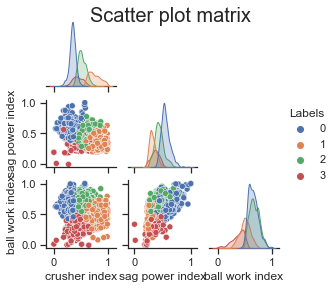

In [19]:
# Visualización de variables estandarizadas
matrix=pd.DataFrame(MinMax.fit_transform(df_sample[tags_dispatch]),columns=tags_dispatch)
matrix["Labels"]=labels
matrix["Labels"]=matrix["Labels"].astype("category")
sns.set(style="ticks", color_codes=True)
g=sns.pairplot(matrix,diag_kind="kde",hue="Labels",height=1.3,corner=True)
g.fig.suptitle("Scatter plot matrix",position=(0.5, 1.01),fontsize=20)
plt.show()

# Indices + granulometría

In [20]:
tags_dispatch=['crusher index', 'sag power index', 'ball work index']+["granulometry"]

df_sample=cleaned.copy().dropna().sample(5000)

# Cols
MinMax=MinMaxScaler()

# Selección de features a estandarizar (todas)

preprocessing_transformer = ColumnTransformer(transformers=[('MinMax', MinMax,  [i for i in tags_dispatch])])

# Creación del pipeline

pipeline = Pipeline([('Preprocessing', preprocessing_transformer),('TSNE', pacmap.PaCMAP(n_components=2, n_neighbors=10))])

# Ejecución del pipeline
features_tsne_embedded = pipeline.fit_transform(df_sample[tags_dispatch])
features_tsne_embedded=pd.DataFrame(features_tsne_embedded,columns=['x_tsne','y_tsne'])

# Visualización de baja dimensionalidad
fig = go.Figure()

fig.add_trace(go.Scatter(x=features_tsne_embedded['x_tsne'], y=features_tsne_embedded['y_tsne'],
                    mode='markers',
                    ))

fig.update_layout(
    title="Visualización de baja dimensionalidad",
    xaxis_title='x_tsne',
    yaxis_title='y_tsne',height=500, width=1200
)      

fig.show()

# Iteración de inercias sobre cada número de clusters ejecutado
inertias = [
    [i, Pipeline([('Preprocessing', preprocessing_transformer),('k-means', KMeans(n_clusters=i, random_state=0))]).fit(df_sample)[1].inertia_]
    for i in range(1, 10)]

# Se guardan inercias y número de clusters en un data frame
inertias = pd.DataFrame(inertias, columns=["n° clusters", "inertia"])

# Visualización del método del codo
fig=px.line(inertias, x="n° clusters", y="inertia", title="Método del Codo con K-Means")
fig.update_layout(height=500, width=1200)
fig.show()
# Pipeline entrenamiento k-means con 6 clusters
pipeline1=Pipeline([('Preprocessing', preprocessing_transformer),('k-means', KMeans(n_clusters=4, random_state=0))])
# Entrenamiento de pipeline
pipeline1.fit(df_sample)

# Predicción de labels
labels=pipeline1.predict(df_sample)

# Para la visualización agregamos los labels al dataframe de baja dimensionalidad
features_tsne_embedded["Labels"]=labels
features_tsne_embedded["Labels"]=features_tsne_embedded["Labels"].astype("category")

# Visualización de clusterización en baja dimensionalidad

fig = px.scatter(features_tsne_embedded, x="x_tsne", y="y_tsne",color="Labels")

fig.update_layout(
    title="Visualización de baja dimensionalidad con clusters",
    xaxis_title='x_tsne',
    yaxis_title='y_tsne',
height=500, width=1200
)  
fig.show()



In [21]:
# 3D
df_sample=cleaned.copy().dropna().sample(5000)

# Cols
MinMax=MinMaxScaler()

# Selección de features a estandarizar (todas)

preprocessing_transformer = ColumnTransformer(transformers=[('MinMax', MinMax,  [i for i in tags_dispatch])])

# Creación del pipeline

pipeline = Pipeline([('Preprocessing', preprocessing_transformer),('pacmap', pacmap.PaCMAP(n_components=3, n_neighbors=10))])

# Ejecución del pipeline
features_pacmap = pipeline.fit_transform(df_sample[tags_dispatch])
features_pacmap=pd.DataFrame(features_pacmap,columns=['x_pacmap','y_pacmap','z_pacmap'])


fig = px.scatter_3d(
    features_pacmap,
    x='x_pacmap',
    y='y_pacmap',
    z='z_pacmap',
 
    title='3d pacmap'
)
fig.update_layout(
height=500, width=1200
)  
fig.show()

# Iteración de inercias sobre cada número de clusters ejecutado
inertias = [
    [i, Pipeline([('Preprocessing', preprocessing_transformer),('k-means', KMeans(n_clusters=i, random_state=0))]).fit(df_sample)[1].inertia_]
    for i in range(1, 10)]

# Se guardan inercias y número de clusters en un data frame
inertias = pd.DataFrame(inertias, columns=["n° clusters", "inertia"])

# Visualización del método del codo
fig=px.line(inertias, x="n° clusters", y="inertia", title="Método del Codo con K-Means")
fig.update_layout(height=500, width=1200)
fig.show()


# Pipeline entrenamiento k-means con 6 clusters
pipeline1=Pipeline([('Preprocessing', preprocessing_transformer),('k-means', KMeans(n_clusters=4, random_state=0))])
# Entrenamiento de pipeline
pipeline1.fit(df_sample)

# Predicción de labels
labels=pipeline1.predict(df_sample)

# Para la visualización agregamos los labels al dataframe de baja dimensionalidad
features_pacmap["Labels"]=labels
features_pacmap["Labels"]=features_pacmap["Labels"].astype("category")

# Visualización de clusterización en baja dimensionalidad
fig = px.scatter_3d(
    features_pacmap,
    x='x_pacmap',
    y='y_pacmap',
    z='z_pacmap',
    color="Labels",
    title='3d pacmap'
)

fig.update_layout(
height=500, width=1200
)  
fig.show()

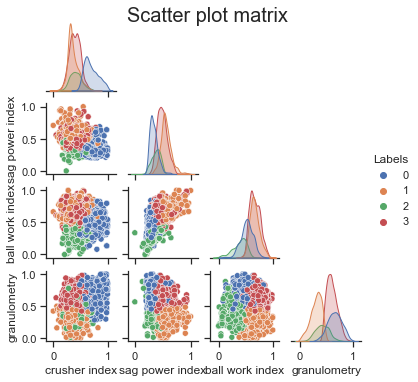

In [22]:
# Visualización de variables estandarizadas
matrix=pd.DataFrame(MinMax.fit_transform(df_sample[tags_dispatch]),columns=tags_dispatch)
matrix["Labels"]=labels
matrix["Labels"]=matrix["Labels"].astype("category")
sns.set(style="ticks", color_codes=True)
g=sns.pairplot(matrix,diag_kind="kde",hue="Labels",height=1.3,corner=True)
g.fig.suptitle("Scatter plot matrix",position=(0.5, 1.01),fontsize=20)
plt.show()

# HH y LL CC, HH TPH y TPH

In [23]:
tags_dispatch=[ 'charge cell', 'TPH', 'LL charge cell', 'HH charge cell', 'HH TPH',]

df_sample=cleaned.copy().dropna().sample(5000)

# Cols
MinMax=MinMaxScaler()

# Selección de features a estandarizar (todas)

preprocessing_transformer = ColumnTransformer(transformers=[('MinMax', MinMax,  [i for i in tags_dispatch])])

# Creación del pipeline

pipeline = Pipeline([('Preprocessing', preprocessing_transformer),('TSNE', pacmap.PaCMAP(n_components=2, n_neighbors=10))])

# Ejecución del pipeline
features_tsne_embedded = pipeline.fit_transform(df_sample[tags_dispatch])
features_tsne_embedded=pd.DataFrame(features_tsne_embedded,columns=['x_tsne','y_tsne'])

# Visualización de baja dimensionalidad
fig = go.Figure()

fig.add_trace(go.Scatter(x=features_tsne_embedded['x_tsne'], y=features_tsne_embedded['y_tsne'],
                    mode='markers',
                    ))

fig.update_layout(
    title="Visualización de baja dimensionalidad",
    xaxis_title='x_tsne',
    yaxis_title='y_tsne',height=500, width=1200
)      

fig.show()

# Iteración de inercias sobre cada número de clusters ejecutado
inertias = [
    [i, Pipeline([('Preprocessing', preprocessing_transformer),('k-means', KMeans(n_clusters=i, random_state=0))]).fit(df_sample)[1].inertia_]
    for i in range(1, 10)]

# Se guardan inercias y número de clusters en un data frame
inertias = pd.DataFrame(inertias, columns=["n° clusters", "inertia"])

# Visualización del método del codo
fig=px.line(inertias, x="n° clusters", y="inertia", title="Método del Codo con K-Means")
fig.update_layout(height=500, width=1200)
fig.show()
# Pipeline entrenamiento k-means con 6 clusters
pipeline1=Pipeline([('Preprocessing', preprocessing_transformer),('k-means', KMeans(n_clusters=3, random_state=0))])
# Entrenamiento de pipeline
pipeline1.fit(df_sample)

# Predicción de labels
labels=pipeline1.predict(df_sample)

# Para la visualización agregamos los labels al dataframe de baja dimensionalidad
features_tsne_embedded["Labels"]=labels
features_tsne_embedded["Labels"]=features_tsne_embedded["Labels"].astype("category")

# Visualización de clusterización en baja dimensionalidad

fig = px.scatter(features_tsne_embedded, x="x_tsne", y="y_tsne",color="Labels")

fig.update_layout(
    title="Visualización de baja dimensionalidad con clusters",
    xaxis_title='x_tsne',
    yaxis_title='y_tsne',
height=500, width=1200
)  
fig.show()

In [24]:
# 3D
df_sample=cleaned.copy().dropna().sample(5000)

# Cols
MinMax=MinMaxScaler()

# Selección de features a estandarizar (todas)

preprocessing_transformer = ColumnTransformer(transformers=[('MinMax', MinMax,  [i for i in tags_dispatch])])

# Creación del pipeline

pipeline = Pipeline([('Preprocessing', preprocessing_transformer),('pacmap', pacmap.PaCMAP(n_components=3, n_neighbors=10))])

# Ejecución del pipeline
features_pacmap = pipeline.fit_transform(df_sample[tags_dispatch])
features_pacmap=pd.DataFrame(features_pacmap,columns=['x_pacmap','y_pacmap','z_pacmap'])


fig = px.scatter_3d(
    features_pacmap,
    x='x_pacmap',
    y='y_pacmap',
    z='z_pacmap',
 
    title='3d pacmap'
)
fig.update_layout(
height=500, width=1200
)  
fig.show()

# Iteración de inercias sobre cada número de clusters ejecutado
inertias = [
    [i, Pipeline([('Preprocessing', preprocessing_transformer),('k-means', KMeans(n_clusters=i, random_state=0))]).fit(df_sample)[1].inertia_]
    for i in range(1, 10)]

# Se guardan inercias y número de clusters en un data frame
inertias = pd.DataFrame(inertias, columns=["n° clusters", "inertia"])

# Visualización del método del codo
fig=px.line(inertias, x="n° clusters", y="inertia", title="Método del Codo con K-Means")
fig.update_layout(height=500, width=1200)
fig.show()


# Pipeline entrenamiento k-means con 6 clusters
pipeline1=Pipeline([('Preprocessing', preprocessing_transformer),('k-means', KMeans(n_clusters=3, random_state=0))])
# Entrenamiento de pipeline
pipeline1.fit(df_sample)

# Predicción de labels
labels=pipeline1.predict(df_sample)

# Para la visualización agregamos los labels al dataframe de baja dimensionalidad
features_pacmap["Labels"]=labels
features_pacmap["Labels"]=features_pacmap["Labels"].astype("category")

# Visualización de clusterización en baja dimensionalidad
fig = px.scatter_3d(
    features_pacmap,
    x='x_pacmap',
    y='y_pacmap',
    z='z_pacmap',
    color="Labels",
    title='3d pacmap'
)

fig.update_layout(
height=500, width=1200
)  
fig.show()

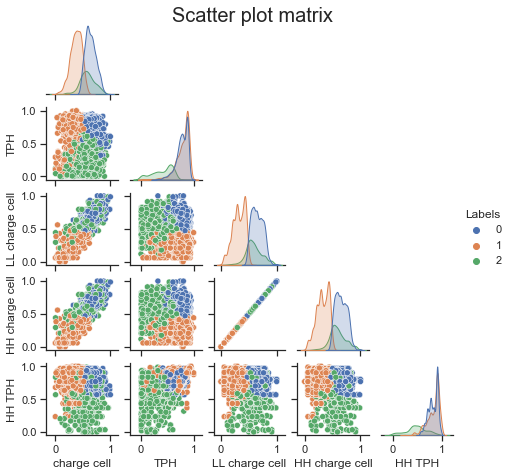

In [25]:
# Visualización de variables estandarizadas
matrix=pd.DataFrame(MinMax.fit_transform(df_sample[tags_dispatch]),columns=tags_dispatch)
matrix["Labels"]=labels
matrix["Labels"]=matrix["Labels"].astype("category")
sns.set(style="ticks", color_codes=True)
g=sns.pairplot(matrix,diag_kind="kde",hue="Labels",height=1.3,corner=True)
g.fig.suptitle("Scatter plot matrix",position=(0.5, 1.01),fontsize=20)
plt.show()